In [1]:
!kaggle datasets download jiwasambhuwara/food-ingredients

food-ingredients.zip: Skipping, found more recently modified local copy (use --force to force download)


In [2]:
import os
import numpy as np
import zipfile
import shutil
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img

2023-05-16 02:23:38.322188: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-16 02:23:40.110015: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64
2023-05-16 02:23:40.110083: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/loca

In [3]:
data_path = './data'
# Check if the folder exists
if os.path.exists(data_path):
    # Delete the folder and all its contents
    shutil.rmtree(data_path)
else:
    print(f"The folder {data_path} does not exist.")

In [4]:
os.mkdir('data')
with zipfile.ZipFile('food-ingredients.zip', 'r') as zip_ref:
    zip_ref.extractall('./data')

In [5]:
src_dir = './data/Food Dataset'
dst_dir = './data'

for root, dirs, files in os.walk(src_dir):
    for dir in dirs:
        # Join the root directory with the current directory to create the full path
        current_dir = os.path.join(root, dir)
        # Move the current directory and all its contents to the destination directory
        shutil.move(current_dir, dst_dir)

In [6]:
os.rmdir('./data/Food Dataset')

In [7]:
# Define the training and validation base directories
train_dir = './data/train'
test_dir = './data/test'
val_dir = './data/val'

labels = [name for name in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, name))]

In [8]:
# Move each file in test folder to train folder
for label in labels:
    # Get a list of all the files in the source directory
    files = os.listdir(os.path.join(test_dir, label))

    # Move each file to the target directory
    for f in files:
        # Construct the full path to the file
        src_path = os.path.join(test_dir, os.path.join(label, f))
        dst_path = os.path.join(train_dir, os.path.join(label, f))
        shutil.move(src_path, dst_path)

In [9]:
# Use shutil.rmtree() to delete the folder and its subfolders
shutil.rmtree('./data/test')

Sample Jagung image:


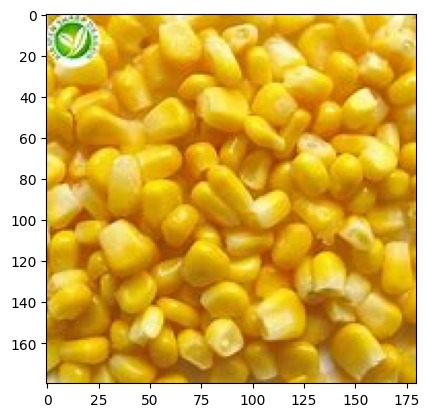

Sample Pork belly image:


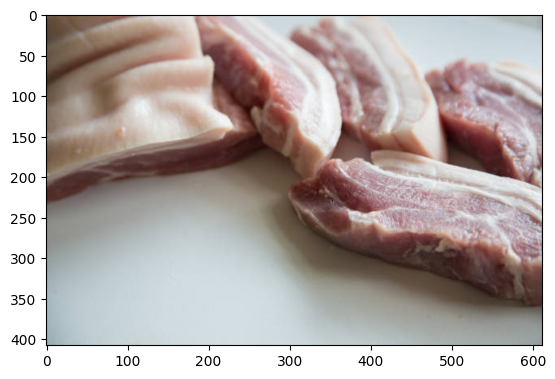

Sample Paprika image:


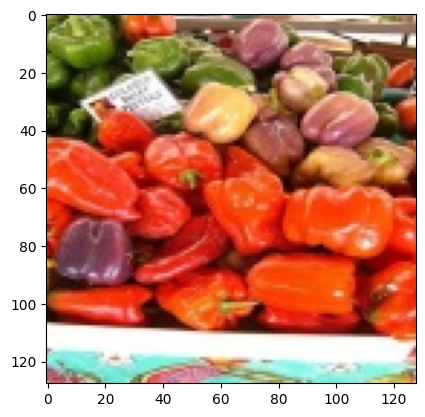

Sample Apel image:


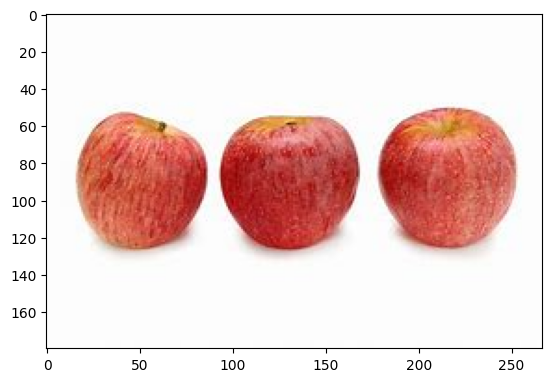

Sample Anggur image:


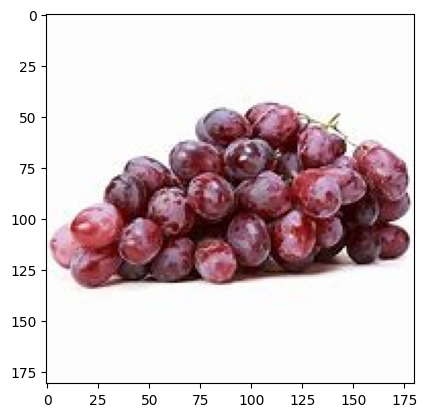

Sample Nasi merah image:


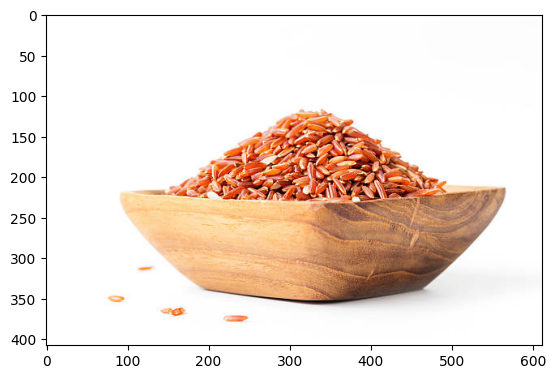

Sample Pokcoy image:


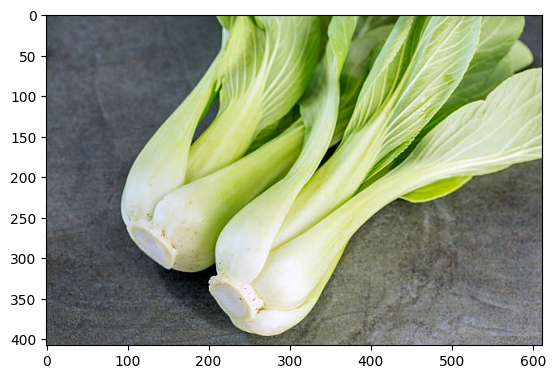

Sample Melon image:


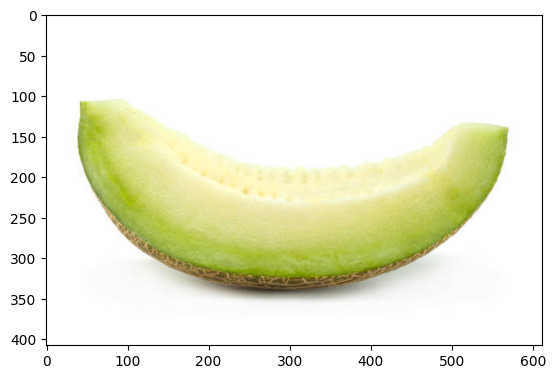

Sample Brokoli image:


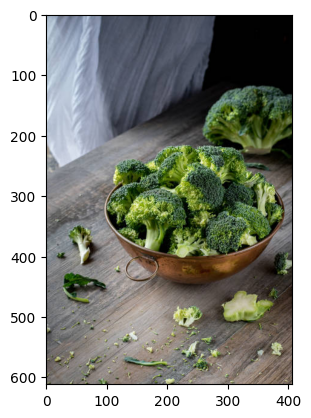

Sample Labu image:


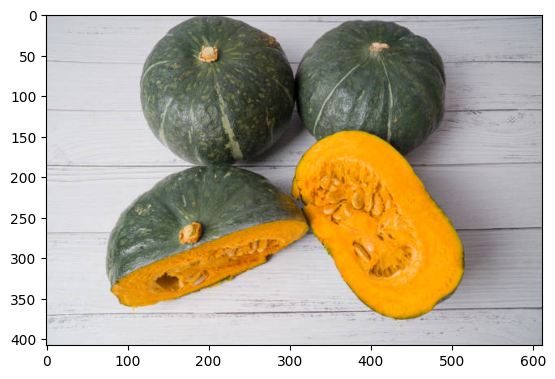

Sample Tauge image:


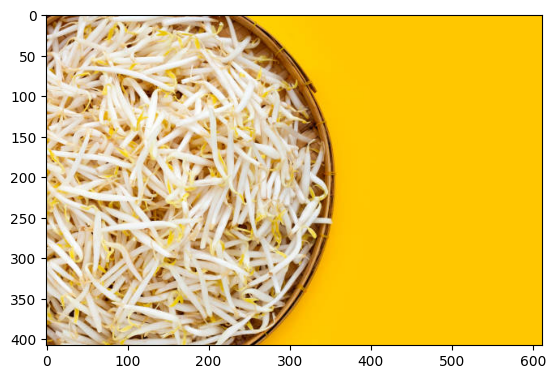

Sample Semangka image:


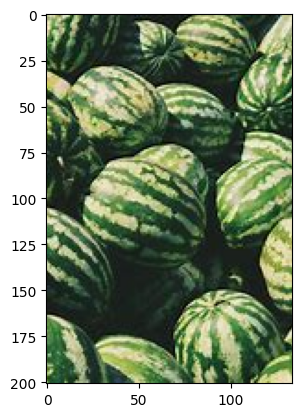

Sample Terong image:


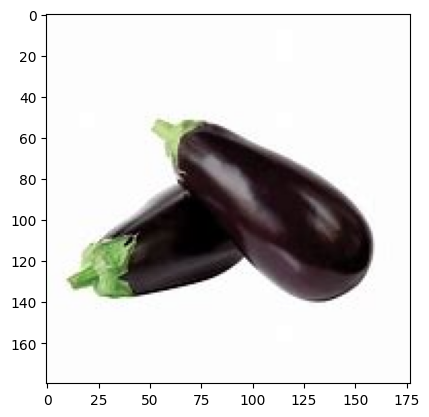

Sample Kentang image:


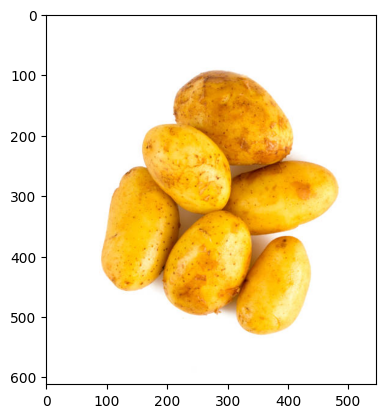

Sample Durian image:


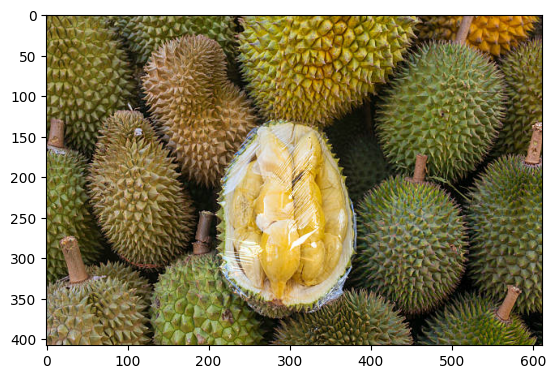

Sample Lobak Merah image:


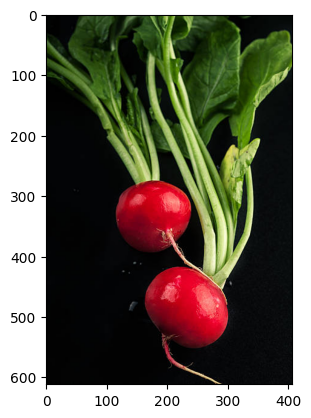

Sample Pepaya image:


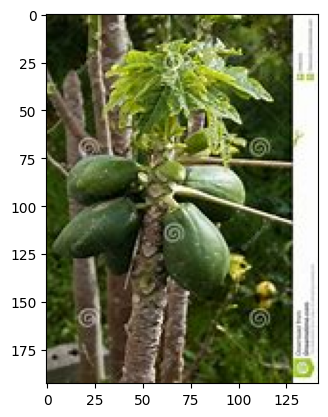

Sample Labu Siam image:


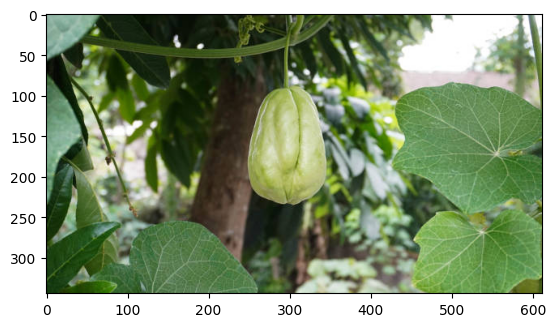

Sample Singkong image:


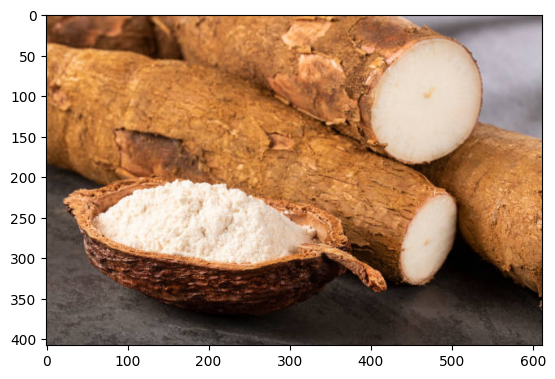

Sample Tahu image:


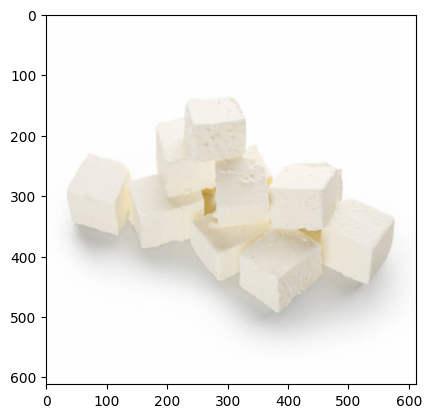

Sample Lemon image:


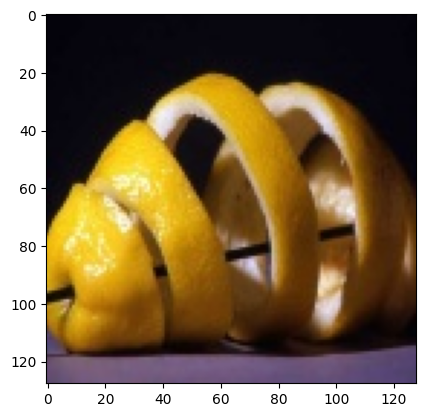

Sample Pir image:


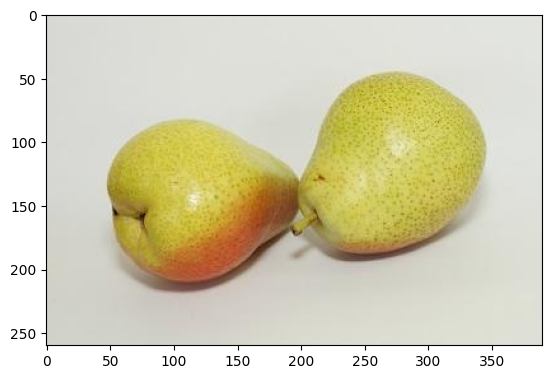

Sample Tomat image:


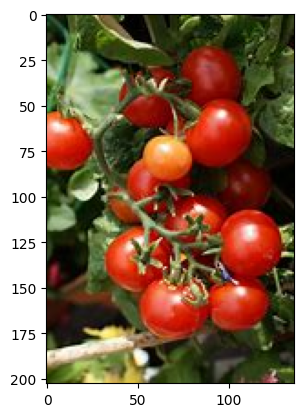

Sample Stroberi image:


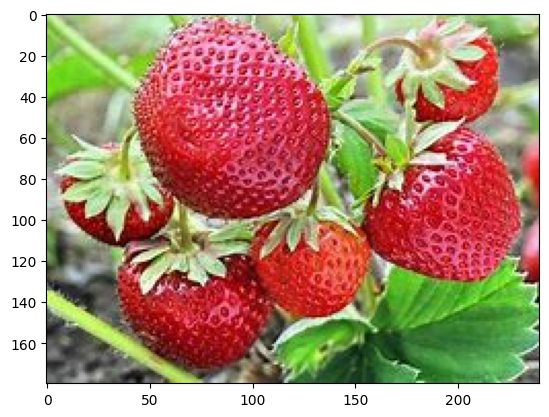

Sample Kulit ayam image:


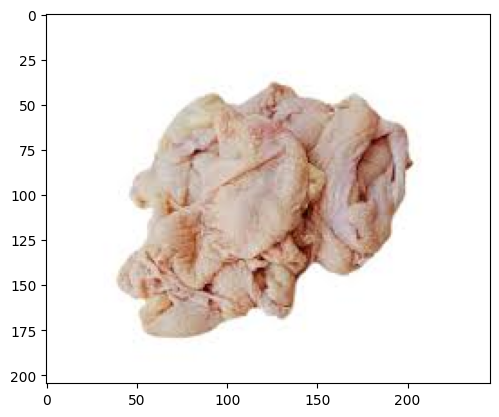

Sample Buah naga image:


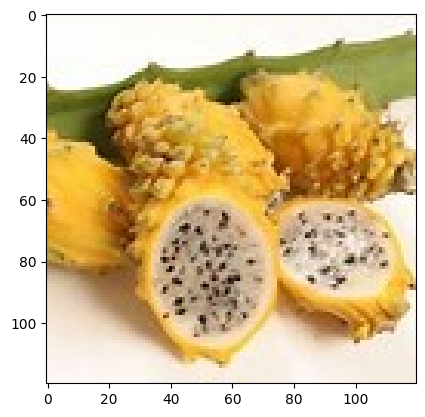

Sample Mangga image:


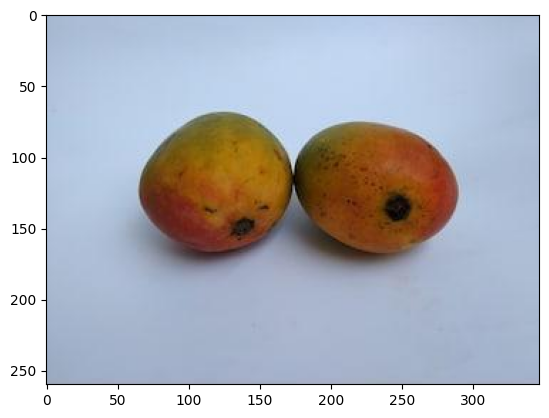

Sample Wortel image:


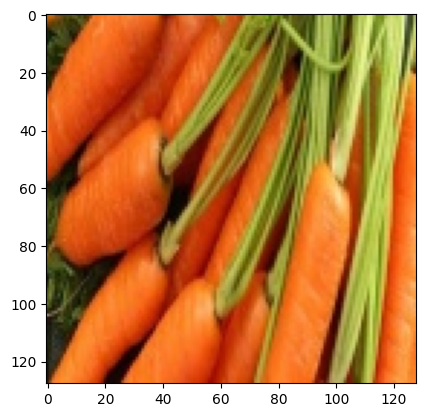

Sample Ceker ayam image:


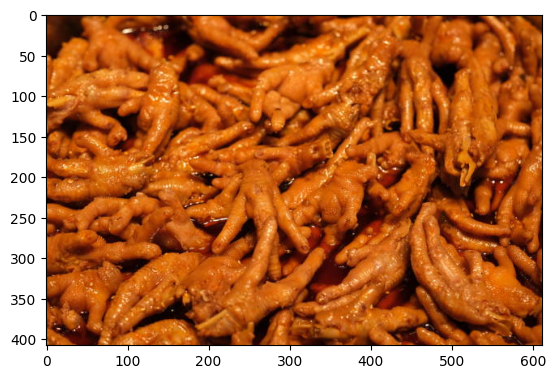

Sample Nangka image:


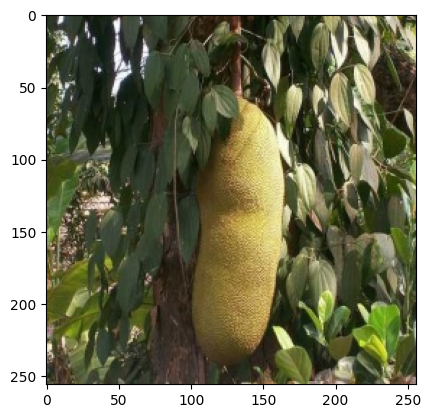

Sample Kangkung image:


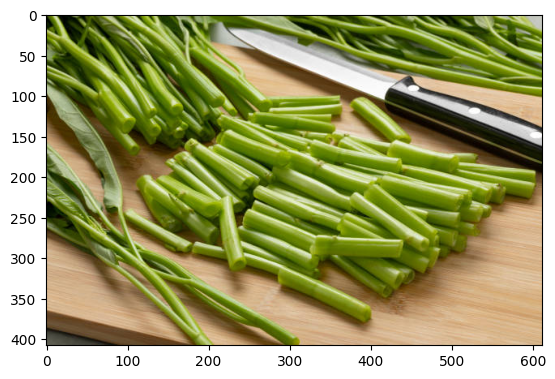

Sample Sayap Ayam image:


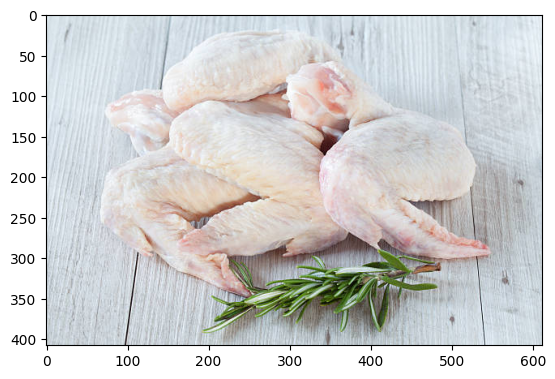

Sample Kacang Mete image:


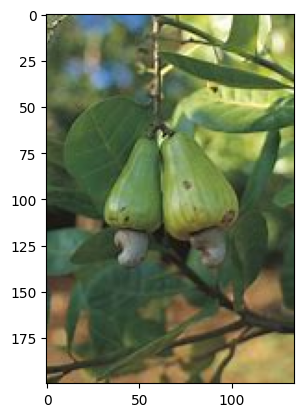

Sample Kelapa image:


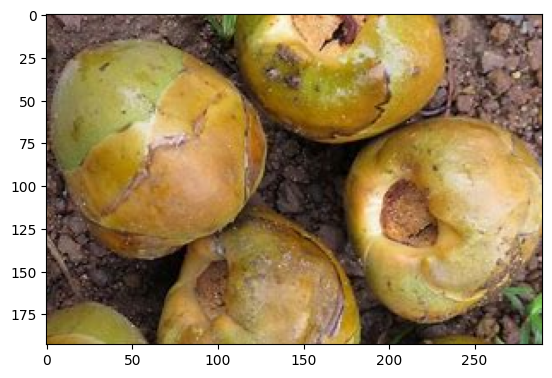

Sample Nasi putih image:


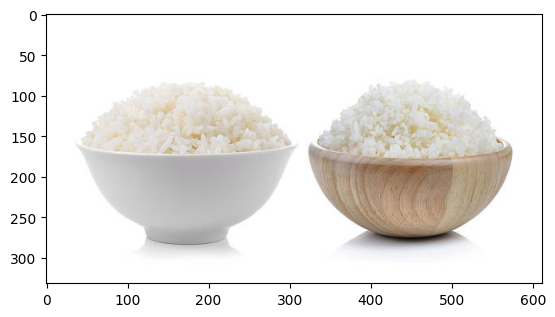

Sample Leci image:


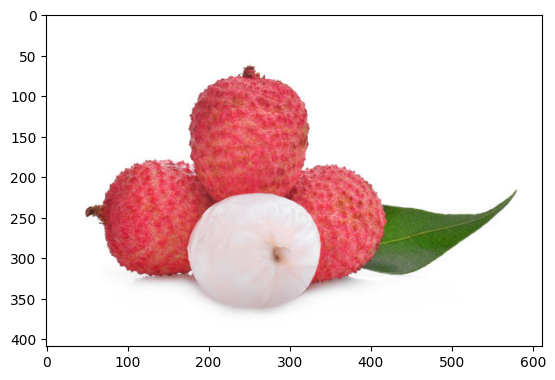

Sample Klengkeng image:


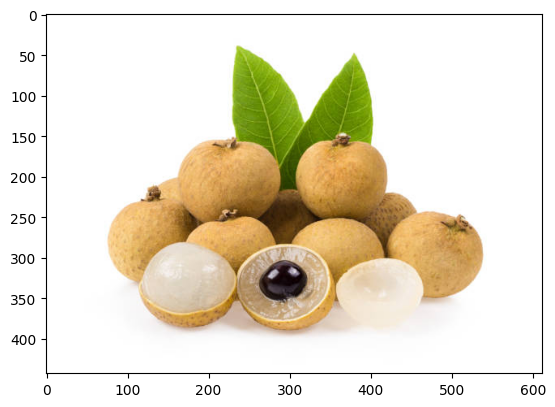

Sample Ubi image:


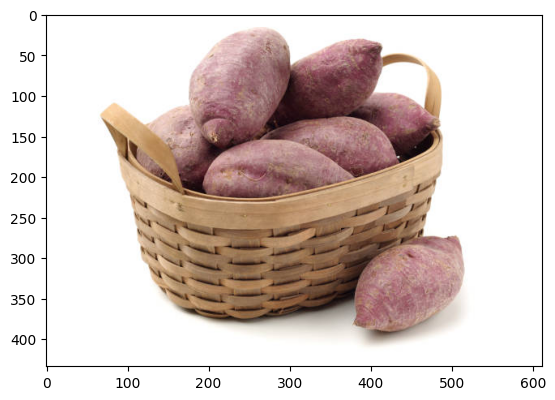

Sample Jambu Air image:


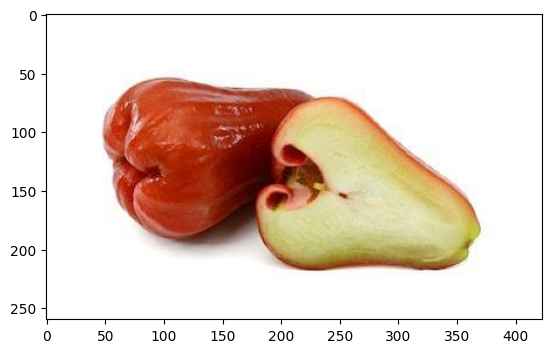

Sample Kembang Kol image:


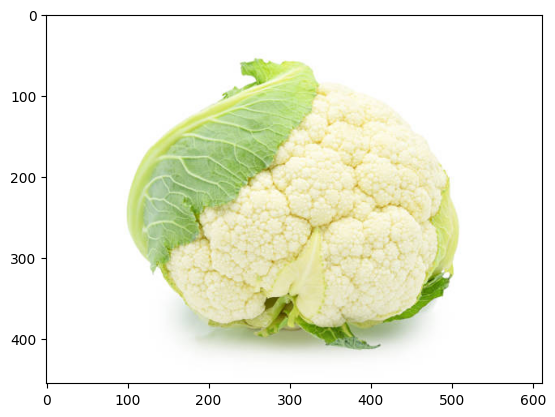

Sample Tempe image:


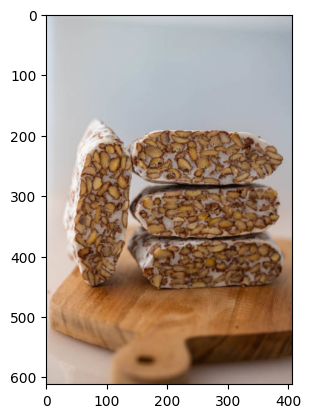

Sample Pare image:


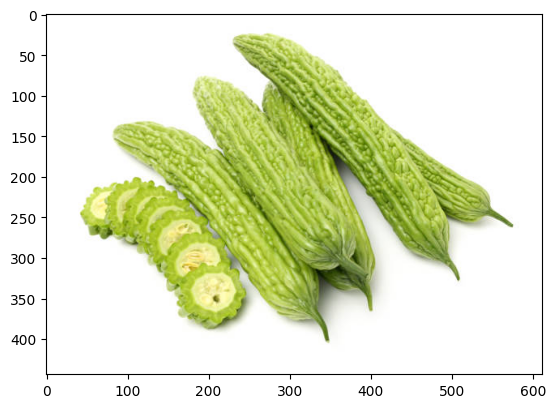

Sample Jeruk image:


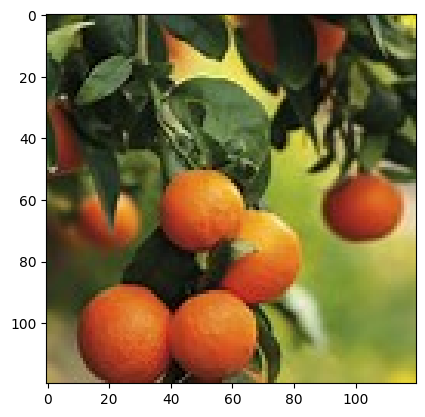

Sample Pisang image:


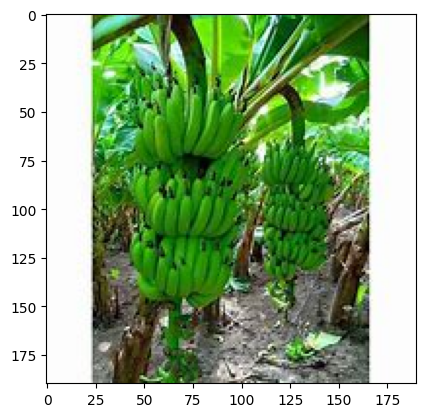

Sample Paha bawah ayam image:


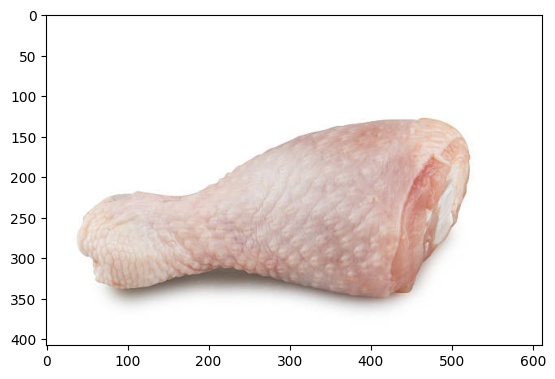

Sample Salmon image:


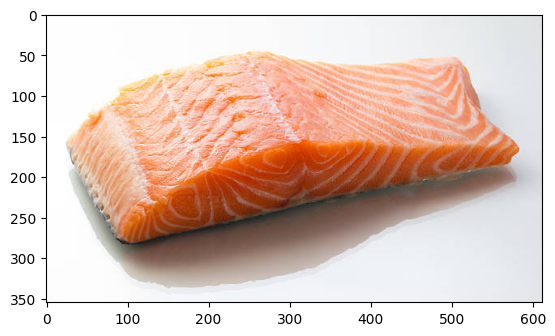

Sample Telur image:


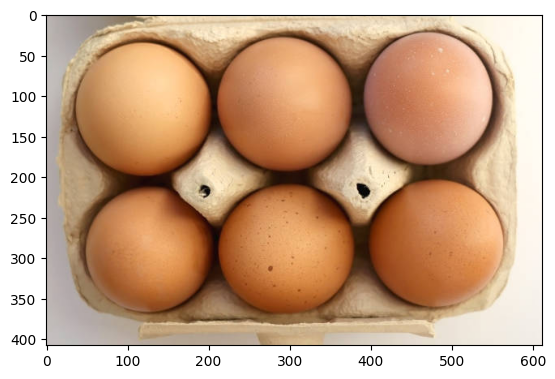

Sample Mentimun image:


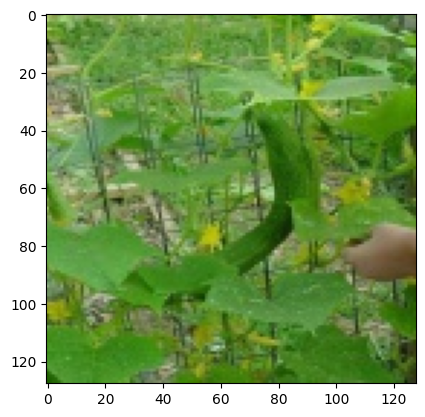

Sample Alpukat image:


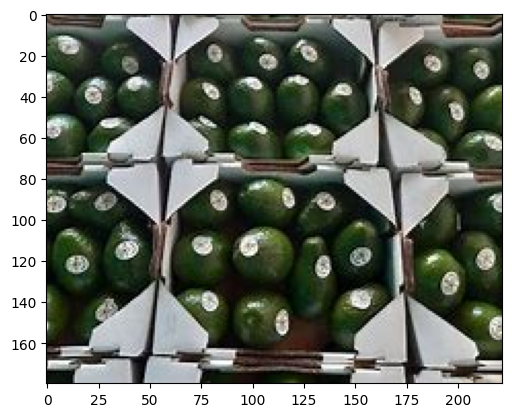

Sample Kacang polong image:


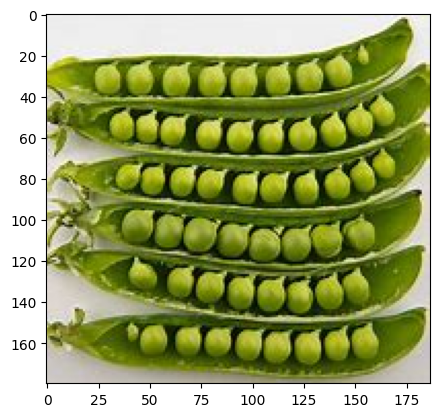

Sample Rambutan image:


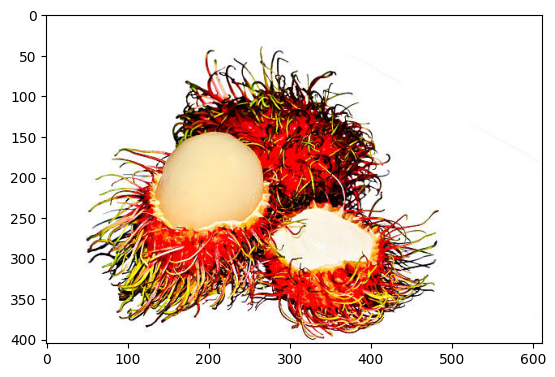

Sample Asparagus image:


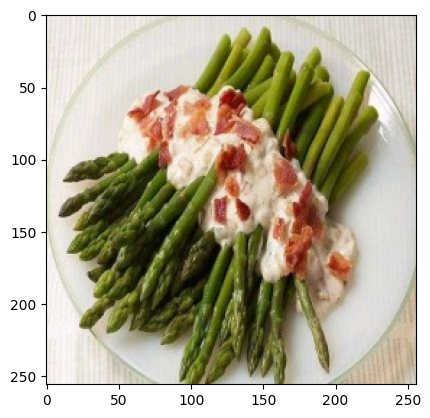

Sample Dada ayam image:


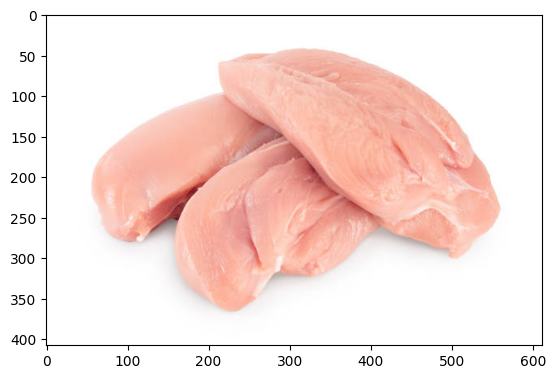

Sample Nanas image:


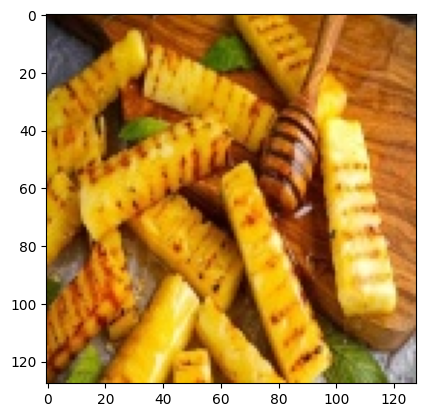

Sample Kacang tanah image:


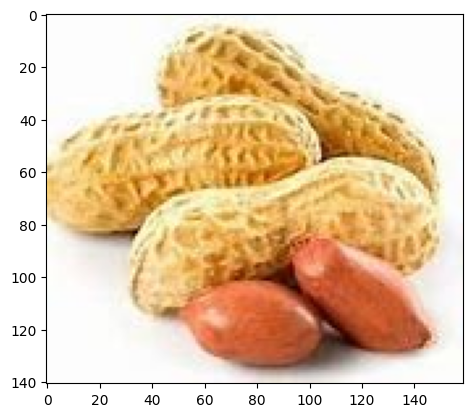

In [10]:
for i in range(len(labels)):
    print(f"Sample {labels[i]} image:")
    plt.imshow(load_img(f"{os.path.join(os.path.join(train_dir, labels[i]), os.listdir(os.path.join(train_dir, labels[i]))[0])}"))
    plt.show()

In [11]:
for i in range(len(labels)):
    # Load the first example of a ingredient
    sample_image  = load_img(f"{os.path.join(os.path.join(train_dir, labels[i]), os.listdir(os.path.join(train_dir, labels[i]))[0])}")

    # Convert the image into its numpy array representation
    sample_array = img_to_array(sample_image)

    print(f"image has shape: {sample_array.shape}")

image has shape: (180, 180, 3)
image has shape: (408, 612, 3)
image has shape: (128, 128, 3)
image has shape: (180, 267, 3)
image has shape: (181, 180, 3)
image has shape: (408, 612, 3)
image has shape: (408, 612, 3)
image has shape: (408, 612, 3)
image has shape: (612, 408, 3)
image has shape: (408, 612, 3)
image has shape: (408, 612, 3)
image has shape: (201, 134, 3)
image has shape: (180, 177, 3)
image has shape: (612, 547, 3)
image has shape: (408, 612, 3)
image has shape: (612, 408, 3)
image has shape: (193, 142, 3)
image has shape: (344, 612, 3)
image has shape: (408, 612, 3)
image has shape: (612, 612, 3)
image has shape: (128, 128, 3)
image has shape: (260, 390, 3)
image has shape: (203, 136, 3)
image has shape: (180, 240, 3)
image has shape: (205, 246, 3)
image has shape: (120, 120, 3)
image has shape: (260, 347, 3)
image has shape: (128, 128, 3)
image has shape: (408, 612, 3)
image has shape: (256, 256, 3)
image has shape: (408, 612, 3)
image has shape: (408, 612, 3)
image ha

In [12]:
def train_val_generators(TRAINING_DIR, VALIDATION_DIR):
    # Instantiate the ImageDataGenerator class 
    # Don't forget to normalize pixel values and set arguments to augment the images 
    train_datagen = ImageDataGenerator(rescale=1./255,
                                     rotation_range=40,
                                     width_shift_range=0.2,
                                     height_shift_range=0.2,
                                     shear_range=0.2,
                                     zoom_range=0.2,
                                     horizontal_flip=True)

    # Pass in the appropriate arguments to the flow_from_directory method
    train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=32, 
                                                      class_mode='categorical',
                                                      target_size=(300, 300))
    
    # Instantiate the ImageDataGenerator class (don't forget to set the rescale argument)
    # Remember that validation data should not be augmented
    validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

    # Pass in the appropriate arguments to the flow_from_directory method
    validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                    batch_size=32, 
                                                                    class_mode='categorical',
                                                                    target_size=(300, 300))

    return train_generator, validation_generator

In [13]:
# Test generators
train_generator, validation_generator = train_val_generators(train_dir, val_dir)

Found 22633 images belonging to 55 classes.
Found 5186 images belonging to 55 classes.


In [14]:
model_path = './pre-trained-model'
# Check if the folder exists
if os.path.exists(model_path):
    # Delete the folder and all its contents
    shutil.rmtree(model_path)
else:
    print(f"The folder {model_path} does not exist.")

In [15]:
os.makedirs('pre-trained-model')

In [16]:
# Download the inception v3 weights
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O ./pre-trained-model/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2023-05-16 02:23:56--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.199.128, 142.250.107.128, 74.125.20.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.199.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘./pre-trained-model/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

./pre-trained-model 100%[===================>]  83.84M   216MB/s    in 0.4s    

2023-05-16 02:23:56 (216 MB/s) - ‘./pre-trained-model/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [17]:
# Import the inception model  
from tensorflow.keras.applications.inception_v3 import InceptionV3
     
# Create an instance of the inception model from the local pre-trained weights
local_weights_file = './pre-trained-model/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [18]:
def create_pre_trained_model(local_weights_file):
    pre_trained_model = InceptionV3(input_shape = (300, 300, 3),
                                  include_top = False, 
                                  weights = None) 

    pre_trained_model.load_weights(local_weights_file)

    # Make all the layers in the pre-trained model non-trainable
    for layer in pre_trained_model.layers:
        layer.trainable = False

    return pre_trained_model

In [19]:
pre_trained_model = create_pre_trained_model(local_weights_file)

# Print the model summary
pre_trained_model.summary()

2023-05-16 02:23:57.078725: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64
2023-05-16 02:23:57.078754: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-05-16 02:23:57.078770: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (tensorflow-2-11-20230515-231442): /proc/driver/nvidia/version does not exist
2023-05-16 02:23:57.079651: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild Tens

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 300, 300, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [20]:
total_params = pre_trained_model.count_params()
num_trainable_params = sum([w.shape.num_elements() for w in pre_trained_model.trainable_weights])

print(f"There are {total_params:,} total parameters in this model.")
print(f"There are {num_trainable_params:,} trainable parameters in this model.")

There are 21,802,784 total parameters in this model.
There are 0 trainable parameters in this model.


In [21]:
# Define a Callback class that stops training once accuracy reaches 99.9%
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.999):
      print("\nReached 99.9% accuracy so cancelling training!")
      self.model.stop_training = True

In [22]:
output = pre_trained_model.output
print(output)

KerasTensor(type_spec=TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name=None), name='mixed10/concat:0', description="created by layer 'mixed10'")


In [23]:
print(f"The pretrained model has type: {type(pre_trained_model)}")

The pretrained model has type: <class 'keras.engine.functional.Functional'>


In [33]:
def create_final_model(pre_trained_model, output):
    
    x = tf.keras.layers.Conv2D(256, kernel_size=(3, 3), activation='relu')(output)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Conv2D(128, kernel_size=(3, 3), activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(1024, activation='relu')(x)   

    predictions = tf.keras.layers.Dense(55, activation='softmax')(x)

    model = tf.keras.models.Model(inputs=pre_trained_model.input, outputs=predictions)

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [34]:
# Save model in a variable
model = create_final_model(pre_trained_model, output)

# Inspect parameters
total_params = model.count_params()
num_trainable_params = sum([w.shape.num_elements() for w in model.trainable_weights])

print(f"There are {total_params:,} total parameters in this model.")
print(f"There are {num_trainable_params:,} trainable parameters in this model.")

There are 27,013,399 total parameters in this model.
There are 5,210,615 trainable parameters in this model.


In [ ]:
callbacks = myCallback()
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs = 10,
                    verbose = 2,
                    callbacks=callbacks)

Epoch 1/10
708/708 - 1008s - loss: 2.3508 - accuracy: 0.3801 - val_loss: 1.6101 - val_accuracy: 0.5584 - 1008s/epoch - 1s/step
Epoch 2/10
708/708 - 1006s - loss: 1.4863 - accuracy: 0.5898 - val_loss: 1.2044 - val_accuracy: 0.6680 - 1006s/epoch - 1s/step
Epoch 3/10
708/708 - 1005s - loss: 1.2578 - accuracy: 0.6570 - val_loss: 1.0729 - val_accuracy: 0.6980 - 1005s/epoch - 1s/step
Epoch 4/10


In [ ]:
# Plot the training and validation accuracies for each epoch

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()